In [1]:
import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt
import imageio

# Load the .mha file
image = sitk.ReadImage("/kaggle/input/retinal-oct-glaucoma/retinal-oct-glaucoma/POAG_0000_0000.mha")
array = sitk.GetArrayFromImage(image)
array = array.astype(np.uint8)
output_gif_path = "output_animation.gif"
imageio.mimsave(output_gif_path, array, duration=1)

print(f"GIF saved at {output_gif_path}")

GIF saved at output_animation.gif


### Resizing Images to 64x64x64

In [2]:
from skimage.transform import resize
import numpy as np
import os

def resize_3d_image(image, target_shape):
    resized_image = resize(image, target_shape, mode='constant', preserve_range=True)
    return resized_image

# Load all images
input_dir = "/content/drive/MyDrive/Data/glaucoma_dataset/poag/"
output_dir = "/content/drive/MyDrive/Data/glaucoma_dataset/poag_resized/"
target_shape = (64, 64, 64)

os.makedirs(output_dir, exist_ok=True)

for filename in os.listdir(input_dir):
    if filename.endswith(".npy"):
        image = np.load(os.path.join(input_dir, filename))
        resized_image = resize_3d_image(image, target_shape)
        np.save(os.path.join(output_dir, filename), resized_image)

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Data/glaucoma_dataset/poag/'

### Data Augmentation

In [ ]:
import numpy as np
from scipy.ndimage import rotate, shift, zoom
import random
import os

def augment_image(image):
    # Random rotation
    angle = random.uniform(-30, 30)  
    image = rotate(image, angle, reshape=False)

    # Random flip
    if random.random() > 0.5:
        image = np.fliplr(image)  
        
    zoom_factor = random.uniform(0.9, 1.1)  
    image = zoom(image, zoom_factor)

    brightness_factor = random.uniform(0.8, 1.2)  
    image = image * brightness_factor
    image = np.clip(image, 0, 1)  

    return image

# Load normal images
normal_images = [np.load(f"/content/drive/MyDrive/Data/glaucoma_dataset/normal/n_{i}.npy") for i in range(1, 471)]

augmented_images = []
for image in normal_images:
    for _ in range(3):  
        augmented_image = augment_image(image)
        augmented_images.append(augmented_image)
        
for i, img in enumerate(augmented_images):
    np.save(f"/content/drive/MyDrive/Data/glaucoma_dataset/normal/n_{i+471}.npy", img)

### Visualise 2D and 3D image

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Function to plot 2D image
def plot_2d_image(image_path):
  image_2d = np.load(image_path)
  plt.imshow(image_2d, cmap='gray')
  plt.title(f"2D Image: {image_path.split('/')[-1]}")
  plt.show()
def plot_3d_image_slice(image_path, slice_index=32):
    image_3d = np.load(image_path)
    plt.imshow(image_3d[slice_index, :, :], cmap='gray')
    plt.title(f"3D Image Slice {slice_index}: {image_path.split('/')[-1]}")
    plt.show()

# Example usage for a single file
file_path_2d = "/content/drive/MyDrive/Data/glaucoma_dataset/poag_2d/g_10.npy"  
file_path_3d = "/content/drive/MyDrive/Data/glaucoma_dataset/poag_resized/g_10.npy"  


plot_2d_image(file_path_2d)
plot_3d_image_slice(file_path_3d)

## Animate 3D Numpy image

In [1]:
import numpy as np
import plotly.graph_objects as go

# Load your 3D image
image = np.load("/kaggle/input/glaucoma-3d/poag_3d/poag_3d/g_10.npy")
image = np.squeeze(image)  

# Create 3D volume rendering
fig = go.Figure(data=go.Volume(
    x=np.linspace(0, 63, 64).repeat(64*64),
    y=np.tile(np.linspace(0, 63, 64).repeat(64), 64),
    z=np.tile(np.linspace(0, 63, 64), 64*64),
    value=image.flatten(),
    opacity=0.1,
    surface_count=20  
))
fig.show()

In [ ]:
import numpy as np
import plotly.graph_objects as go

# Load your 3D image
image = np.load("/kaggle/input/glaucoma-3d/normal_3d/normal_3d/n_10.npy")
image = np.squeeze(image)  

# Create 3D volume rendering
fig = go.Figure(data=go.Volume(
    x=np.linspace(0, 63, 64).repeat(64*64),
    y=np.tile(np.linspace(0, 63, 64).repeat(64), 64),
    z=np.tile(np.linspace(0, 63, 64), 64*64),
    value=image.flatten(),
    opacity=0.1,
    surface_count=20  
))
fig.show()

In [ ]:
def normalize_images(image_dir):
    for filename in os.listdir(image_dir):
        if filename.endswith(".npy"):
            filepath = os.path.join(image_dir, filename)
            try:
                image = np.load(filepath)
                image_min = image.min()
                image_max = image.max()
                if image_max != image_min: 
                    normalized_image = (image - image_min) / (image_max - image_min)
                else:
                    normalized_image = image 
                np.save(filepath, normalized_image)
                print(f"Normalized {filename}")
            except Exception as e:
                print(f"Error processing {filename}: {e}")

normalize_images(NORMAL_2D_DIR)
normalize_images(NORMAL_3D_DIR)
normalize_images(POAG_2D_DIR)
normalize_images(POAG_3D_DIR)

## Train-Test Splitting

In [1]:
import numpy as np
import os

glaucoma_3d_data_dir = "/kaggle/input/glaucoma-3d/poag_3d/poag_3d"
normal_3d_data_dir = "/kaggle/input/glaucoma-3d/normal_3d/normal_3d"
normal_2d_data_dir = "/kaggle/input/glaucoma-2d/normal_2d"
glaucoma_2d_data_dir = "/kaggle/input/glaucoma-2d/poag_2d"

### 2D Data Prep for training

In [33]:
# Load 2D glaucoma images and assign labels
glaucoma_2d_files = [f for f in os.listdir(glaucoma_2d_data_dir) if f.startswith('g_')]
glaucoma_2d_images = [np.load(os.path.join(glaucoma_2d_data_dir, f)) for f in glaucoma_2d_files]
glaucoma_2d_labels = [1] * len(glaucoma_2d_images)  # Label 1 for glaucoma

# Load 2D normal images and assign labels
normal_2d_files = [f for f in os.listdir(normal_2d_data_dir) if f.startswith('n_')]
normal_2d_images = [np.load(os.path.join(normal_2d_data_dir, f)) for f in normal_2d_files]
normal_2d_labels = [0] * len(normal_2d_images)  # Label 0 for normal

NameError: name 'glaucoma_2d_data_dir' is not defined

In [ ]:
def check_and_reshape(images):
  reshaped_images = []
  for image in images:
    if image.shape != (64, 64, 1):
      image = np.reshape(image, (64, 64, 1))
    reshaped_images.append(image)
  return reshaped_images

glaucoma_2d_images = check_and_reshape(glaucoma_2d_images)
normal_2d_images = check_and_reshape(normal_2d_images)

In [34]:
[f.shape for f in glaucoma_2d_images]

NameError: name 'glaucoma_2d_images' is not defined

In [ ]:
from sklearn.utils import shuffle

# Combine data and labels
X = np.array(glaucoma_2d_images + normal_2d_images)  
y = np.array(glaucoma_2d_labels + normal_2d_labels)  

# Shuffle the dataset
X, y = shuffle(X, y, random_state=42)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
import numpy as np
print("Train set - Glaucoma:", np.sum(y_train == 1), "Normal:", np.sum(y_train == 0))
print("Test set - Glaucoma:", np.sum(y_test == 1), "Normal:", np.sum(y_test == 0))

In [ ]:
y_train = tf.keras.utils.to_categorical(y_train, num_classes=2)
y_test = tf.keras.utils.to_categorical(y_test, num_classes=2)

### 3D data prep for training

In [2]:
# Load 3D glaucoma images and assign labels
glaucoma_3d_files = [f for f in os.listdir(glaucoma_3d_data_dir) if f.startswith('g_')]
glaucoma_3d_images = [np.load(os.path.join(glaucoma_3d_data_dir, f)) for f in glaucoma_3d_files]
glaucoma_3d_labels = [1] * len(glaucoma_3d_images)  

# Load 3D normal images and assign labels
normal_3d_files = [f for f in os.listdir(normal_3d_data_dir) if f.startswith('n_')]
normal_3d_images = [np.load(os.path.join(normal_3d_data_dir, f)) for f in normal_3d_files]
normal_3d_labels = [0] * len(normal_3d_images)

In [3]:
def check_and_reshape(images):
  reshaped_images = []
  for image in images:
    if image.shape != (64, 64, 64, 1):
      image = np.reshape(image, (64, 64, 64, 1))
    reshaped_images.append(image)
  return reshaped_images

glaucoma_3d_images = check_and_reshape(glaucoma_3d_images)
normal_3d_images = check_and_reshape(normal_3d_images)

In [37]:
[f.shape for f in glaucoma_3d_images]

[(64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 64, 1),
 (64, 64, 

In [4]:
len(glaucoma_3d_labels)

1524

In [5]:
import numpy as np
from sklearn.utils import shuffle

# Combine data and labels
X = np.array([img[..., np.newaxis] if img.ndim == 3 else img for img in glaucoma_3d_images + normal_3d_images])
y = np.array(glaucoma_3d_labels + normal_3d_labels)  
X, y = shuffle(X, y, random_state=42)

In [6]:
y.shape
y

array([0, 0, 0, ..., 1, 1, 1])

In [7]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [8]:
import numpy as np
print("Train set - Glaucoma:", np.sum(y_train == 1), "Normal:", np.sum(y_train == 0))
print("Test set - Glaucoma:", np.sum(y_test == 1), "Normal:", np.sum(y_test == 0))

Train set - Glaucoma: 1219 Normal: 1219
Test set - Glaucoma: 305 Normal: 305


In [9]:
import tensorflow as tf

y_train = tf.keras.utils.to_categorical(y_train, num_classes=2)
y_test = tf.keras.utils.to_categorical(y_test, num_classes=2)

# 2D ResNet-18 in Tensorflow

In [44]:
import tensorflow as tf
from tensorflow.keras import layers, Model

def build_resnet18_2d_glaucoma(input_shape=(64, 64, 1), num_classes=2):
    """ResNet-18 modified for 64x64 glaucoma detection"""
    inputs = layers.Input(shape=input_shape)

    # Initial Conv Layer
    x = layers.Conv2D(64, kernel_size=7, strides=2, padding='same', use_bias=False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.MaxPooling2D(pool_size=3, strides=2, padding='same')(x)

    # Residual Blocks 
    def basic_block(x, filters, stride=1):
        shortcut = x
        x = layers.Conv2D(filters, kernel_size=3, strides=stride, padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)

        x = layers.Conv2D(filters, kernel_size=3, strides=1, padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)

        if stride != 1 or x.shape[-1] != shortcut.shape[-1]:
            shortcut = layers.Conv2D(filters, kernel_size=1, strides=stride, padding='same', use_bias=False)(shortcut)
            shortcut = layers.BatchNormalization()(shortcut)

        x = layers.Add()([x, shortcut])
        x = layers.ReLU()(x)
        return x

    filter_sizes = [64, 128, 256, 512]
    strides = [1, 2, 2, 2]
    for filters, stride in zip(filter_sizes, strides):
        x = basic_block(x, filters, stride)
        x = basic_block(x, filters)

    # Global Average Pooling & Fully Connected Layer
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256, activation='relu')(x)  
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(128, activation='relu')(x)  
    x = layers.Dropout(0.5)(x)  
    outputs = layers.Dense(num_classes, activation='softmax')(x)  

    model = Model(inputs, outputs, name="ResNet-18-Glaucoma")
    return model

# Create modified ResNet-18 model
resnet18_2d_model = build_resnet18_2d_glaucoma()
resnet18_2d_model.summary()

Model: "ResNet-18-Glaucoma"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 64, 64, 1)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 32, 32, 64)     │          3,136 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 32, 32, 64)     │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 32, 32, 64)     │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 16, 16, 64)     │              0 │ re_lu[0][0]            │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 16, 16, 64)     │         36,864 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 16, 16, 64)     │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 16, 16, 64)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 16, 16, 64)     │         36,864 │ re_lu_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 16, 16, 64)     │            256 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 16, 16, 64)     │              0 │ batch_normalization_2… │
│                           │                        │                │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_2 (ReLU)            │ (None, 16, 16, 64)     │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 16, 16, 64)     │         36,864 │ re_lu_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 16, 16, 64)     │            256 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_3 (ReLU)            │ (None, 16, 16, 64)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 16, 16, 64)     │         36,864 │ re_lu_3[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4

 Total params: 11,344,322 (43.28 MB)

 Trainable params: 11,334,722 (43.24 MB)

 Non-trainable params: 9,600 (37.50 KB)

In [45]:
resnet18_2d_model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint

history = resnet18_2d_model.fit(
    X_train, y_train,
    batch_size=32,
    epochs=10,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
        ModelCheckpoint(os.path.join(data_dir,'resnet18_2d_glaucoma_model.keras'), save_best_only=True)
    ],
    validation_data=(X_test, y_test)
)

In [ ]:
test_loss, test_acc = resnet18_2d_model.evaluate(X_test, y_test)
print(f"Test accuracy: {test_acc:.4f}")

## Load and predict using the model

### To predict the entire folder

In [6]:
import numpy as np
import os
import tensorflow as tf

# Load the trained model
# model_path = '/content/drive/MyDrive/Data/resnet18_2d_glaucoma_model.keras'
model_path = "/kaggle/input/2d-resnet-18-glaucoma-model/keras/default/1/resnet18_2d_glaucoma_model.keras"
resnet18_2d_model = tf.keras.models.load_model(model_path)

# Directory containing the 2D images
# image_dir = "/content/drive/MyDrive/Data/normal_2d"
image_dir = "/kaggle/input/glaucoma-2d/normal_2d"

image_files = [f for f in os.listdir(image_dir) if f.endswith(".npy")]

# Loop through each image file
for image_file in image_files:
  image_path = os.path.join(image_dir, image_file)
  try:
      image = np.load(image_path)
      if image.shape != (64, 64, 1):
        image = np.reshape(image,(64, 64, 1))
      image = image[np.newaxis, ...]
      prediction = resnet18_2d_model.predict(image)
      predicted_class = np.argmax(prediction)
      print(f"Filename: {image_file}, Predicted Class: {predicted_class}")

  except Exception as e:
      print(f"Error processing {image_file}: {e}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 929ms/step
Filename: n_1258.npy, Predicted Class: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Filename: n_24.npy, Predicted Class: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Filename: n_630.npy, Predicted Class: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Filename: n_996.npy, Predicted Class: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Filename: n_1233.npy, Predicted Class: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Filename: n_1338.npy, Predicted Class: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Filename: n_809.npy, Predicted Class: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Filename: n_411.npy, Predicted Class: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Filename: n_1352.npy, Predicted Class: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Filename: n_230.npy, Predicted Class: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Filename: n_1278.npy, Predicted Class: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Filename: n_1450.npy, Predicted Class: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Filename: n_430.npy,

In [18]:
import numpy as np
import os
import tensorflow as tf
import matplotlib.pyplot as plt

# model_path = '/content/drive/MyDrive/Data/resnet18_2d_glaucoma_model.keras'
model_path = "/kaggle/input/2d-resnet-18-glaucoma-model/keras/default/1/resnet18_2d_glaucoma_model.keras"
resnet18_2d_model = tf.keras.models.load_model(model_path)
image_index = int(input("Enter the image number (0-1524): "))

# image_file = np.load(f"/content/drive/MyDrive/Data/poag_2d/g_{image_index}.npy")
image_file_normal = np.load(f"/kaggle/input/glaucoma-2d/normal_2d/n_{image_index}.npy")
image_file_poag = np.load(f"/kaggle/input/glaucoma-2d/poag_2d/g_{image_index}.npy")

def do_prediction(image):
    if image.shape != (64, 64, 1):
        try:
            image = np.reshape(image, (64, 64, 1))
        except ValueError:
            print("Cannot be reshaped!")
            return
    plt.imshow(image)
    image = np.expand_dims(image, axis=0)
    prediction = resnet18_2d_model.predict(image)
    print(prediction)
    predicted_class = np.argmax(prediction)
    print(predicted_class)


Enter the image number (0-1524):  123


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
[[0.07770257 0.9222975 ]]
1


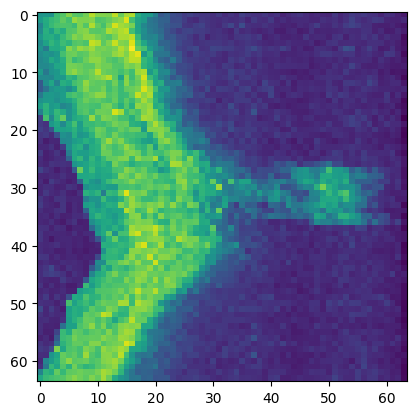

In [19]:
do_prediction(image_file_normal)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1


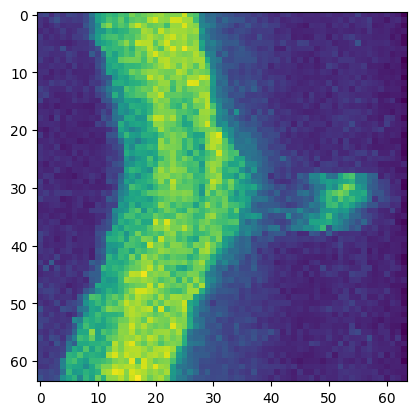

In [19]:
do_prediction(image_file_poag)

## Evaluation of 2D ResNet Model

X_test shape: (3048, 64, 64, 1)
y_test shape: (3048,)
96/96 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step
Predictions completed!
              precision    recall  f1-score   support

      Normal       0.85      0.94      0.90      1524
    Glaucoma       0.93      0.84      0.88      1524

    accuracy                           0.89      3048
   macro avg       0.89      0.89      0.89      3048
weighted avg       0.89      0.89      0.89      3048



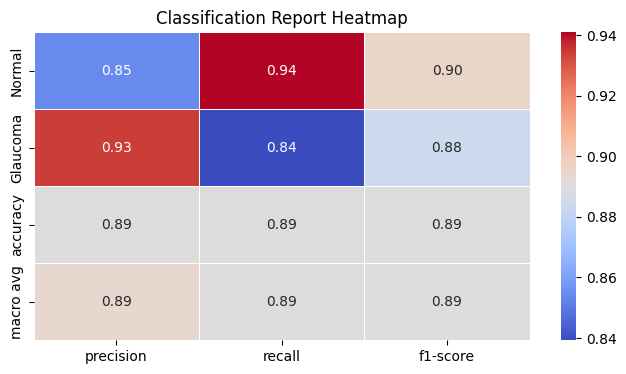

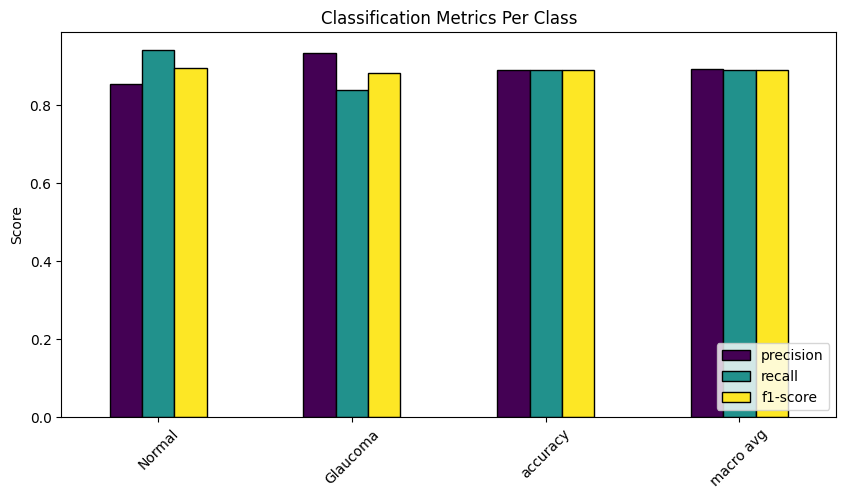

In [10]:
import numpy as np
import os
from tensorflow import keras

normal_path = "/kaggle/input/glaucoma-2d/normal_2d"
poag_path = "/kaggle/input/glaucoma-2d/poag_2d"

# Function to load and reshape images
def load_images_from_folder(folder_path, label, target_shape=(64, 64, 1)):
    images = []
    labels = []
    
    for file in os.listdir(folder_path):
        if file.endswith(".npy"):
            img = np.load(os.path.join(folder_path, file))
            
            # Ensure correct shape
            if img.shape != target_shape:
                img = np.reshape(img, target_shape)  # Reshape if necessary
            
            images.append(img)
            labels.append(label)

    return images, labels

# Load both categories
X_normal, y_normal = load_images_from_folder(normal_path, label=0)
X_poag, y_poag = load_images_from_folder(poag_path, label=1)

# Convert lists to numpy arrays
X_test = np.array(X_normal + X_poag, dtype=np.float32)  
y_test = np.array(y_normal + y_poag)

print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")

model = keras.models.load_model("/kaggle/input/2d-resnet-18-glaucoma-model/keras/default/1/resnet18_2d_glaucoma_model.keras")

y_pred_probs = model.predict(X_test)

# Convert probabilities to class labels
y_pred = np.argmax(y_pred_probs, axis=1)  

print("Predictions completed!")

from sklearn.metrics import classification_report

class_names = ["Normal", "Glaucoma"]

# Generate report
report = classification_report(y_test, y_pred, target_names=class_names)
print(report)

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Convert report to DataFrame
report_dict = classification_report(y_test, y_pred, target_names=class_names, output_dict=True)
df = pd.DataFrame(report_dict).T.iloc[:-1, :3]  

# Plot heatmap
plt.figure(figsize=(8, 4))
sns.heatmap(df, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Classification Report Heatmap")
plt.show()

if 'support' in df.columns:
    df = df.drop(columns=['support'])

df.plot(kind='bar', figsize=(10, 5), colormap='viridis', edgecolor='black')
plt.title("Classification Metrics Per Class")
plt.ylabel("Score")
plt.xticks(rotation=45)
plt.legend(loc='lower right')
plt.show()

# 3D ResNet-18 in PyTorch

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import numpy as np
import os
import glob
from sklearn.model_selection import train_test_split

# Custom Dataset for 3D Numpy Images
class GlaucomaDataset(Dataset):
    def __init__(self, file_paths, transform=None):
        self.file_paths = file_paths
        self.transform = transform
    
    def __len__(self):
        return len(self.file_paths)
    
    def __getitem__(self, idx):
        file_path = self.file_paths[idx]
        image = np.load(file_path)  
        label = 0 if "normal_3d" in file_path else 1  
        
        if image.shape[-1] == 1:
            image = image.squeeze(-1)  
        
        if self.transform:
            image = self.transform(image)
        
        return torch.tensor(image, dtype=torch.float32).unsqueeze(0), torch.tensor(label, dtype=torch.long)

# 3D ResNet Model


In [13]:
# Training Loop
def train_model(model, train_loader, val_loader, epochs=20, lr=0.001):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    
    for epoch in range(epochs):
        model.train()
        total_loss, correct, total = 0, 0, 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
        
        val_acc = evaluate_model(model, val_loader, device)
        print(f"Epoch {epoch+1}/{epochs}, Loss: {total_loss/len(train_loader):.4f}, Train Acc: {100*correct/total:.2f}%, Val Acc: {100*val_acc:.2f}%")
    
    return model

# Evaluation Function
def evaluate_model(model, loader, device):
    model.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    return correct / total

### Training 3D ResNet-18 Model

In [1]:
normal_files = glob.glob("/kaggle/input/glaucoma-3d/normal_3d/normal_3d/*.npy")
glaucoma_files = glob.glob("/kaggle/input/glaucoma-3d/poag_3d/poag_3d/*.npy")
all_files = normal_files + glaucoma_files

train_files, val_files = train_test_split(all_files, test_size=0.2, random_state=42)

train_dataset = GlaucomaDataset(train_files)
val_dataset = GlaucomaDataset(val_files)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

model = ResNet3D(num_classes=2)
train_model(model, train_loader, val_loader)

Epoch 1/20, Loss: 0.6593, Train Acc: 66.41%, Val Acc: 49.18%
Epoch 2/20, Loss: 0.5653, Train Acc: 70.71%, Val Acc: 48.52%
Epoch 3/20, Loss: 0.5243, Train Acc: 71.41%, Val Acc: 67.87%
Epoch 4/20, Loss: 0.5007, Train Acc: 72.60%, Val Acc: 47.70%
Epoch 5/20, Loss: 0.4858, Train Acc: 73.05%, Val Acc: 77.70%
Epoch 6/20, Loss: 0.4407, Train Acc: 76.46%, Val Acc: 71.31%
Epoch 7/20, Loss: 0.4358, Train Acc: 76.58%, Val Acc: 71.97%
Epoch 8/20, Loss: 0.4307, Train Acc: 77.07%, Val Acc: 51.48%
Epoch 9/20, Loss: 0.4760, Train Acc: 74.77%, Val Acc: 71.97%
Epoch 10/20, Loss: 0.4127, Train Acc: 77.44%, Val Acc: 79.84%
Epoch 11/20, Loss: 0.4219, Train Acc: 76.83%, Val Acc: 72.30%
Epoch 12/20, Loss: 0.4026, Train Acc: 78.38%, Val Acc: 79.51%
Epoch 13/20, Loss: 0.4017, Train Acc: 78.55%, Val Acc: 52.13%
Epoch 14/20, Loss: 0.4078, Train Acc: 77.77%, Val Acc: 51.48%
Epoch 15/20, Loss: 0.3966, Train Acc: 78.79%, Val Acc: 51.80%
Epoch 16/20, Loss: 0.4114, Train Acc: 77.44%, Val Acc: 70.49%
Epoch 17/20, Loss

ResNet3D(
  (conv1): Conv3d(1, 64, kernel_size=(7, 7, 7), stride=(2, 2, 2), padding=(3, 3, 3), bias=False)
  (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool3d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock3D(
      (conv1): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
      (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
      (bn2): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock3D(
      (conv1): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
      (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats

In [4]:
# Function to Save Model
def save_model(model, path="glaucoma_model.pth"):
    torch.save(model.state_dict(), path)
save_model(model)

## Load and Predict

In [16]:
def load_model(path="glaucoma_model.pth"):
    model = ResNet3D(num_classes=2)
    model.load_state_dict(torch.load(path))
    model.eval()
    return model

In [17]:
model = load_model("/kaggle/input/3d-resnet-18-glaucoma/tensorflow2/default/3/glaucoma_model.pth")

<ipython-input-16-2284bfdaf67a>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path))


In [18]:
# Function to Predict
def predict(model, image_path):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()
    
    image = np.load(image_path)
    if image.shape[-1] == 1:
        image = image.squeeze(-1)
    
    image_tensor = torch.tensor(image, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image_tensor)
        prediction = torch.argmax(output, dim=1).item()
    
    return "Glaucoma" if prediction == 1 else "Normal"

In [19]:
image_index = int(input("Enter the image number (0-1524): "))
print(predict(model, f"/kaggle/input/glaucoma-3d/normal_3d/normal_3d/n_{image_index}.npy"))
print(predict(model, f"/kaggle/input/glaucoma-3d/poag_3d/poag_3d/g_{image_index}.npy"))

Enter the image number (0-1524):  111


Normal
Glaucoma


## Evaluation of 3D-ResNet-18

Accuracy: 0.7131
Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.93      0.77       319
           1       0.87      0.47      0.61       291

    accuracy                           0.71       610
   macro avg       0.76      0.70      0.69       610
weighted avg       0.76      0.71      0.70       610



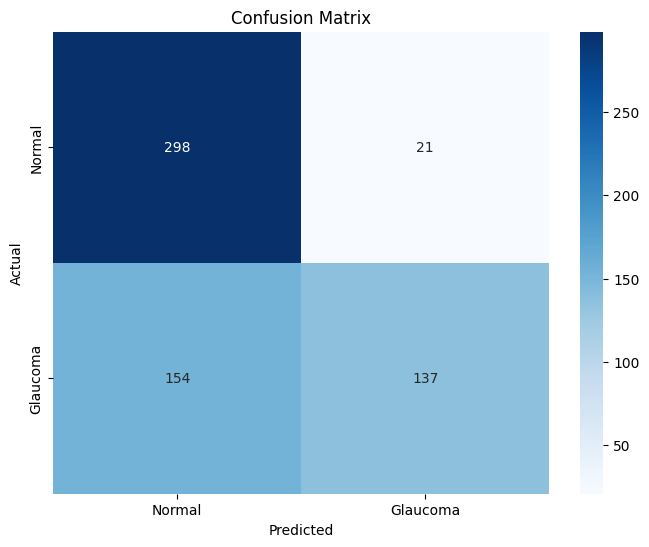

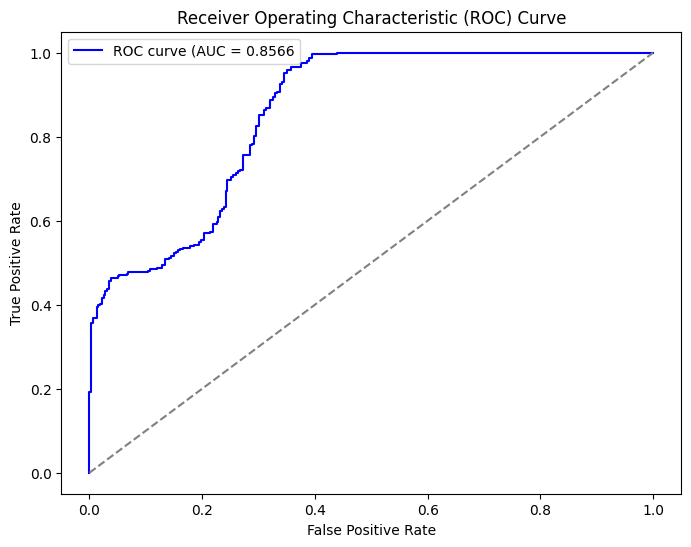

In [9]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, auc
import seaborn as sns

# Function to Evaluate Model
def evaluate_model(model, data_loader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()
    
    all_labels = []
    all_preds = []
    all_probs = []
    
    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds)
            all_probs.extend(probs)
    
    accuracy = accuracy_score(all_labels, all_preds)
    conf_matrix = confusion_matrix(all_labels, all_preds)
    class_report = classification_report(all_labels, all_preds)
    fpr, tpr, _ = roc_curve(all_labels, all_probs)
    roc_auc = auc(fpr, tpr)
    
    print(f"Accuracy: {accuracy:.4f}")
    print("Classification Report:\n", class_report)
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Normal", "Glaucoma"], yticklabels=["Normal", "Glaucoma"])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.4f}')
    plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver Operating Characteristic (ROC) Curve")
    plt.legend()
    plt.show()
    
    return accuracy, class_report, roc_auc

accuracy, report, roc_auc = evaluate_model(model, val_loader)

# 3D CNN Encoder using PyTorch

In [17]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:

# Verify dataset paths and files
normal_dir = '/kaggle/input/glaucoma-3d/normal_3d/normal_3d'
glaucoma_dir = '/kaggle/input/glaucoma-3d/poag_3d/poag_3d'

print(f"Normal directory exists: {os.path.exists(normal_dir)}")
print(f"Glaucoma directory exists: {os.path.exists(glaucoma_dir)}")

normal_files = os.listdir(normal_dir)
glaucoma_files = os.listdir(glaucoma_dir)

print(f"Number of normal files: {len(normal_files)}")
print(f"Number of glaucoma files: {len(glaucoma_files)}")

print("Sample normal files:", normal_files[:5])
print("Sample glaucoma files:", glaucoma_files[:5])

# Define OCTDataset class
class OCTDataset(Dataset):
    def __init__(self, normal_dir, glaucoma_dir, transform=None):
        self.normal_dir = normal_dir
        self.glaucoma_dir = glaucoma_dir
        self.transform = transform

        self.normal_files = [os.path.join(normal_dir, f) for f in os.listdir(normal_dir) if f.endswith('.npy')]
        self.glaucoma_files = [os.path.join(glaucoma_dir, f) for f in os.listdir(glaucoma_dir) if f.endswith('.npy')]

        self.file_list = self.normal_files + self.glaucoma_files
        self.labels = [0] * len(self.normal_files) + [1] * len(self.glaucoma_files)  


        if len(self.file_list) == 0:
            raise ValueError("No .npy files found in the specified directories.")

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        file_path = self.file_list[idx]
        label = self.labels[idx]
        data = np.load(file_path)  


        if data.ndim == 5:  
            data = np.squeeze(data, axis=-1)  
        elif data.ndim == 4:  
            data = np.squeeze(data, axis=-1)  
            data = np.expand_dims(data, axis=0)  
        elif data.ndim == 3:  
            data = np.expand_dims(data, axis=0)  
        else:
            raise ValueError(f"Unexpected data shape: {data.shape}")

        # convert to tensor
        data = torch.tensor(data, dtype=torch.float32)  

        if self.transform:
            data = self.transform(data)
        return data, torch.tensor(label, dtype=torch.float32)  

# Create dataset
dataset = OCTDataset(normal_dir, glaucoma_dir)

# Check dataset size
print(f"Total samples in dataset: {len(dataset)}")

# Check a sample from the dataset
sample_data, sample_label = dataset[0]
print(f"Sample data shape: {sample_data.shape}")
print(f"Sample label: {sample_label}")

# Split dataset into training and testing sets
train_dataset, test_dataset = train_test_split(dataset, test_size=0.2, random_state=42)

# Check sizes of splits
print(f"Training samples: {len(train_dataset)}")
print(f"Testing samples: {len(test_dataset)}")

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

### Define Module


In [2]:
# Define the 5-Layer 3D CNN Encoder
class CNNEncoder3D(nn.Module):
    def __init__(self):
        super(CNNEncoder3D, self).__init__()
        
        # Layer 1
        self.conv1 = nn.Conv3d(in_channels=1, out_channels=32, kernel_size=7, stride=2, padding=3)
        self.bn1 = nn.BatchNorm3d(32)
        self.relu1 = nn.ReLU(inplace=True)
        self.pool1 = nn.MaxPool3d(kernel_size=3, stride=2, padding=1)
        
        # Layer 2
        self.conv2 = nn.Conv3d(in_channels=32, out_channels=64, kernel_size=5, stride=1, padding=2)
        self.bn2 = nn.BatchNorm3d(64)
        self.relu2 = nn.ReLU(inplace=True)
        
        # Layer 3
        self.conv3 = nn.Conv3d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm3d(128)
        self.relu3 = nn.ReLU(inplace=True)
        
        # Layer 4
        self.conv4 = nn.Conv3d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1)
        self.bn4 = nn.BatchNorm3d(256)
        self.relu4 = nn.ReLU(inplace=True)
        
        # Layer 5
        self.conv5 = nn.Conv3d(in_channels=256, out_channels=512, kernel_size=3, stride=1, padding=1)
        self.bn5 = nn.BatchNorm3d(512)
        self.relu5 = nn.ReLU(inplace=True)
        
        # Global Average Pooling
        self.global_avg_pool = nn.AdaptiveAvgPool3d(1)
        
        # Fully Connected Layer (outputs a single logit for binary classification)
        self.fc = nn.Linear(512, 1)

    def forward(self, x):
        # Layer 1
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.pool1(x)
        
        # Layer 2
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu2(x)
        
        # Layer 3
        x = self.conv3(x)
        x = self.bn3(x)
        x = self.relu3(x)
        
        # Layer 4
        x = self.conv4(x)
        x = self.bn4(x)
        x = self.relu4(x)
        
        # Layer 5
        x = self.conv5(x)
        x = self.bn5(x)
        x = self.relu5(x)
        
        # Global Average Pooling
        x = self.global_avg_pool(x)
        x = x.view(x.size(0), -1)  # Flatten
        
        # Fully Connected Layer
        x = self.fc(x)
        return x


In [19]:
# Initialize the 5-layer 3D CNN Encoder
model = CNNEncoder3D()
model = model.to('cuda')

### Training model

In [ ]:
# Define loss function (Binary Cross-Entropy with Logits Loss)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 50
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to('cuda'), labels.to('cuda')
        optimizer.zero_grad()
        outputs = model(inputs).squeeze(1)  # Remove extra dimension
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(train_loader)}')

### Load model

In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = '/kaggle/input/3d_cnn_encoder_glaucoma/pytorch/default/1/3d_cnn_encoder_glaucoma_model.pth'
model = CNNEncoder3D()
model.load_state_dict(torch.load(model_path, map_location=device))

<ipython-input-21-aa458b3ae7a0>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


<All keys matched successfully>

## Evaluate 3D CNN Encoder

Accuracy: 0.7918032786885246
ROC AUC: 0.903726206250202
Confusion Matrix:
[[193 126]
 [  1 290]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.99      0.61      0.75       319
         1.0       0.70      1.00      0.82       291

    accuracy                           0.79       610
   macro avg       0.85      0.80      0.79       610
weighted avg       0.85      0.79      0.78       610



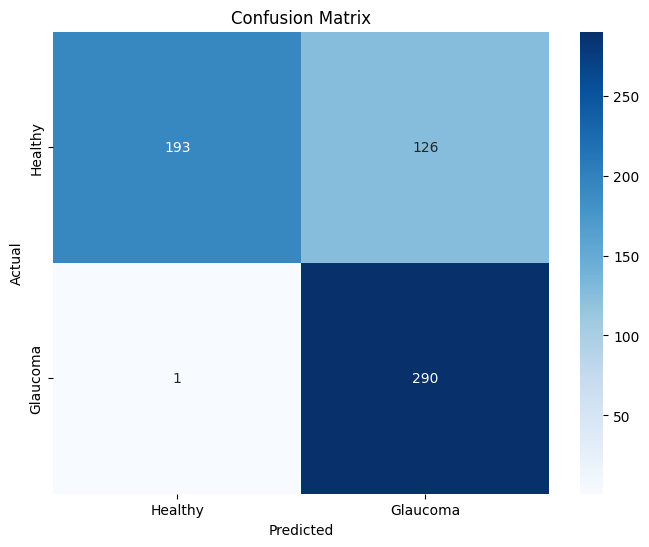

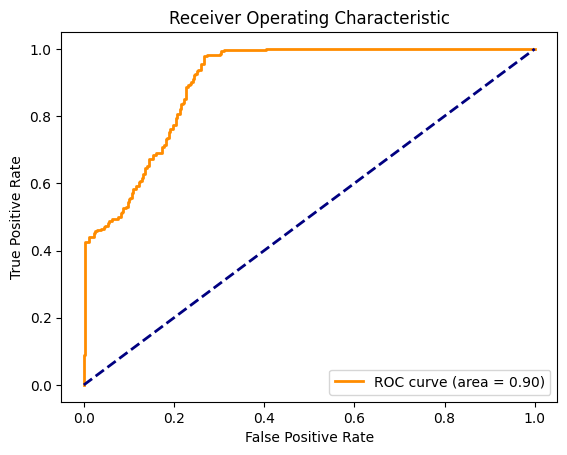

In [24]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move model to CUDA

# Evaluate the model
model.eval()
y_true = []
y_pred = []
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to('cuda'), labels.to('cuda')
        outputs = model(inputs).squeeze(1)  # Remove extra dimension
        probabilities = torch.sigmoid(outputs)  # Apply sigmoid to get probabilities
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(probabilities.cpu().numpy())

# Convert probabilities to binary predictions
y_pred_binary = [1 if p >= 0.5 else 0 for p in y_pred]

# Compute metrics
accuracy = accuracy_score(y_true, y_pred_binary)
roc_auc = roc_auc_score(y_true, y_pred)
conf_matrix = confusion_matrix(y_true, y_pred_binary)
class_report = classification_report(y_true, y_pred_binary)

print(f'Accuracy: {accuracy}')
print(f'ROC AUC: {roc_auc}')
print(f'Confusion Matrix:\n{conf_matrix}')
print(f'Classification Report:\n{class_report}')

# Confusion Matrix Visualization
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Healthy', 'Glaucoma'], yticklabels=['Healthy', 'Glaucoma'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve Visualization
from sklearn.metrics import roc_curve, auc

fpr, tpr, _ = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

## Load and predict using 3D CNN Encoder

In [23]:
import torch
import numpy as np

import torch
import numpy as np

def predict_from_npy(model, npy_path, device):
    """
    Load a .npy file, preprocess it, and predict using a PyTorch model.

    Args:
        model (torch.nn.Module): The trained PyTorch model.
        npy_path (str): Path to the .npy file.
        device (str): Device to run inference on ('cpu' or 'cuda').

    Returns:
        torch.Tensor: Model output (logits or probabilities).
    """
    input_data = np.load(npy_path)
    if input_data.ndim == 5:  # If shape (1, 64, 64, 64, 1)
        input_data = np.squeeze(input_data, axis=-1)
    elif input_data.ndim == 4:  # If shape (64, 64, 64, 1)
        input_data = np.squeeze(input_data, axis=-1)
        input_data = np.expand_dims(input_data, axis=0)  # Add channel dimension
    elif input_data.ndim == 3:  # If shape (64, 64, 64)
        input_data = np.expand_dims(input_data, axis=0)  # Add channel dimension
    else:
        raise ValueError(f"Unexpected data shape: {input_data.shape}")

    # Convert to PyTorch tensor
    input_tensor = torch.tensor(input_data, dtype=torch.float32).unsqueeze(0)

    # Move tensor to correct device
    input_tensor = input_tensor.to(device)

    # Set model to evaluation mode
    model.to(device)
    model.eval()

    with torch.no_grad():  # Disable gradients for inference
        output = model(input_tensor)  # Forward pass

    return output  # Return model output (logits or probabilities)

# Load the trained model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = '/kaggle/input/3d_cnn_encoder_glaucoma/pytorch/default/1/3d_cnn_encoder_glaucoma_model.pth'
model = CNNEncoder3D()
model.load_state_dict(torch.load(model_path, map_location=device))

npy_file_path = "/kaggle/input/glaucoma-3d/normal_3d/normal_3d/n_1.npy"

# Perform prediction
output = predict_from_npy(model, npy_file_path, device)
print("Raw Output:", output)

# If it's a classification task (e.g., glaucoma vs. normal)
predicted_class = torch.argmax(output, dim=1).item()
print("Predicted Class:", predicted_class)

Raw Output: tensor([[-1.9516]], device='cuda:0')
Predicted Class: 0


<ipython-input-23-81ede13db10f>:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


# 3D DenseNet-121 in PyTorch

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

### Dataset preparation

In [5]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Verify dataset paths and files
normal_dir = '/kaggle/input/glaucoma-3d/normal_3d/normal_3d'
glaucoma_dir = '/kaggle/input/glaucoma-3d/poag_3d/poag_3d'

print(f"Normal directory exists: {os.path.exists(normal_dir)}")
print(f"Glaucoma directory exists: {os.path.exists(glaucoma_dir)}")

normal_files = os.listdir(normal_dir)
glaucoma_files = os.listdir(glaucoma_dir)

print(f"Number of normal files: {len(normal_files)}")
print(f"Number of glaucoma files: {len(glaucoma_files)}")

print("Sample normal files:", normal_files[:5])
print("Sample glaucoma files:", glaucoma_files[:5])

# Define OCTDataset class
class OCTDataset(Dataset):
    def __init__(self, normal_dir, glaucoma_dir, transform=None):
        self.normal_dir = normal_dir
        self.glaucoma_dir = glaucoma_dir
        self.transform = transform

        # Get list of files in both directories
        self.normal_files = [os.path.join(normal_dir, f) for f in os.listdir(normal_dir) if f.endswith('.npy')]
        self.glaucoma_files = [os.path.join(glaucoma_dir, f) for f in os.listdir(glaucoma_dir) if f.endswith('.npy')]

        # Combine file lists and assign labels
        self.file_list = self.normal_files + self.glaucoma_files
        self.labels = [0] * len(self.normal_files) + [1] * len(self.glaucoma_files)  # 0 for normal, 1 for glaucoma

        # Ensure files are loaded
        if len(self.file_list) == 0:
            raise ValueError("No .npy files found in the specified directories.")

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        file_path = self.file_list[idx]
        label = self.labels[idx]
        data = np.load(file_path)  # Load the .npy file

        # Ensure data has the correct shape (1, 64, 64, 64)
        if data.ndim == 5:  # If data has shape (1, 64, 64, 64, 1)
            data = np.squeeze(data, axis=-1)  # Remove the last dimension
        elif data.ndim == 4:  # If data has shape (64, 64, 64, 1)
            data = np.squeeze(data, axis=-1)  # Remove the last dimension
            data = np.expand_dims(data, axis=0)  # Add channel dimension
        elif data.ndim == 3:  # If data has shape (64, 64, 64)
            data = np.expand_dims(data, axis=0)  # Add channel dimension
        else:
            raise ValueError(f"Unexpected data shape: {data.shape}")

        data = torch.tensor(data, dtype=torch.float32, device='cuda')  # Convert to tensor

        if self.transform:
            data = self.transform(data)
        return data, label

# Create dataset
dataset = OCTDataset(normal_dir, glaucoma_dir)

# Check dataset size
print(f"Total samples in dataset: {len(dataset)}")

# Check a sample from the dataset
sample_data, sample_label = dataset[0]
print(f"Sample data shape: {sample_data.shape}")
print(f"Sample label: {sample_label}")

# Split dataset into training and testing sets
train_dataset, test_dataset = train_test_split(dataset, test_size=0.2, random_state=42)

# Check sizes of splits
print(f"Training samples: {len(train_dataset)}")
print(f"Testing samples: {len(test_dataset)}")

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

Normal directory exists: True
Glaucoma directory exists: True
Number of normal files: 1524
Number of glaucoma files: 1524
Sample normal files: ['n_1258.npy', 'n_24.npy', 'n_630.npy', 'n_996.npy', 'n_1233.npy']
Sample glaucoma files: ['g_1502.npy', 'g_1398.npy', 'g_654.npy', 'g_572.npy', 'g_1197.npy']
Total samples in dataset: 3048
Sample data shape: torch.Size([1, 64, 64, 64])
Sample label: 0
Training samples: 2438
Testing samples: 610


### Define model

In [1]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

class _DenseLayer(nn.Sequential):
    def __init__(self, num_input_features, growth_rate, bn_size, drop_rate):
        super(_DenseLayer, self).__init__()
        self.add_module('norm1', nn.BatchNorm3d(num_input_features))
        self.add_module('relu1', nn.ReLU(inplace=True))
        self.add_module('conv1', nn.Conv3d(num_input_features, bn_size * growth_rate, kernel_size=1, stride=1, bias=False))
        self.add_module('norm2', nn.BatchNorm3d(bn_size * growth_rate))
        self.add_module('relu2', nn.ReLU(inplace=True))
        self.add_module('conv2', nn.Conv3d(bn_size * growth_rate, growth_rate, kernel_size=3, stride=1, padding=1, bias=False))
        self.drop_rate = drop_rate

    def forward(self, x):
        new_features = super(_DenseLayer, self).forward(x)
        if self.drop_rate > 0:
            new_features = F.dropout(new_features, p=self.drop_rate, training=self.training)
        return torch.cat([x, new_features], 1)

class _DenseBlock(nn.Sequential):
    def __init__(self, num_layers, num_input_features, bn_size, growth_rate, drop_rate):
        super(_DenseBlock, self).__init__()
        for i in range(num_layers):
            layer = _DenseLayer(num_input_features + i * growth_rate, growth_rate, bn_size, drop_rate)
            self.add_module('denselayer%d' % (i + 1), layer)

class _Transition(nn.Sequential):
    def __init__(self, num_input_features, num_output_features):
        super(_Transition, self).__init__()
        self.add_module('norm', nn.BatchNorm3d(num_input_features))
        self.add_module('relu', nn.ReLU(inplace=True))
        self.add_module('conv', nn.Conv3d(num_input_features, num_output_features, kernel_size=1, stride=1, bias=False))
        self.add_module('pool', nn.AvgPool3d(kernel_size=2, stride=2))

class DenseNet3D(nn.Module):
    def __init__(self, growth_rate=32, block_config=(6, 12, 24, 16), num_init_features=64, bn_size=4, drop_rate=0, num_classes=2):
        super(DenseNet3D, self).__init__()
        self.features = nn.Sequential()
        self.features.add_module('conv0', nn.Conv3d(1, num_init_features, kernel_size=7, stride=2, padding=3, bias=False))
        self.features.add_module('norm0', nn.BatchNorm3d(num_init_features))
        self.features.add_module('relu0', nn.ReLU(inplace=True))
        self.features.add_module('pool0', nn.MaxPool3d(kernel_size=3, stride=2, padding=1))
        num_features = num_init_features
        for i, num_layers in enumerate(block_config):
            block = _DenseBlock(num_layers=num_layers, num_input_features=num_features, bn_size=bn_size, growth_rate=growth_rate, drop_rate=drop_rate)
            self.features.add_module('denseblock%d' % (i + 1), block)
            num_features = num_features + num_layers * growth_rate
            if i != len(block_config) - 1:
                trans = _Transition(num_input_features=num_features, num_output_features=num_features // 2)
                self.features.add_module('transition%d' % (i + 1), trans)
                num_features = num_features // 2
        self.features.add_module('norm5', nn.BatchNorm3d(num_features))
        self.features.add_module('relu5', nn.ReLU(inplace=True))
        self.classifier = nn.Linear(num_features, num_classes)

    def forward(self, x):
        features = self.features(x)
        out = F.adaptive_avg_pool3d(features, 1).view(features.size(0), -1)
        out = self.classifier(out)
        return out

### Training the model

In [ ]:
# Initialize the model
model = DenseNet3D(num_classes=2)
model = model.to('cuda')

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 50
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to('cuda'), labels.to('cuda')
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(train_loader)}')

In [ ]:
# Save the model
torch.save(model.state_dict(), 'densenet3d_glaucoma_model.pth')
print("Model saved as densenet3d_glaucoma_model.pth")

### Evaluate the model

In [11]:
torch.cuda.device_count()

1

In [12]:
model_path = '/kaggle/input/3d_densenet_121_glaucoma/pytorch/default/1/densenet3d_glaucoma_model.pth'
model = DenseNet3D(num_classes=2)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.load_state_dict(torch.load(model_path, map_location=lambda storage, loc: storage.cuda(0))) 
model.to(device)

model.eval()
y_true = []
y_pred = []
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to('cuda'), labels.to('cuda')
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())

# Compute metrics
accuracy = accuracy_score(y_true, y_pred)
roc_auc = roc_auc_score(y_true, y_pred)
conf_matrix = confusion_matrix(y_true, y_pred)
class_report = classification_report(y_true, y_pred)

print(f'Accuracy: {accuracy}')
print(f'ROC AUC: {roc_auc}')
print(f'Confusion Matrix:\n{conf_matrix}')
print(f'Classification Report:\n{class_report}')

<ipython-input-12-2696c21e7a23>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=lambda storage, loc: storage.cuda(

Accuracy: 0.8852459016393442
ROC AUC: 0.8819873100001078
Confusion Matrix:
[[304  15]
 [ 55 236]]
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.95      0.90       319
           1       0.94      0.81      0.87       291

    accuracy                           0.89       610
   macro avg       0.89      0.88      0.88       610
weighted avg       0.89      0.89      0.88       610



### Generate Visualization 

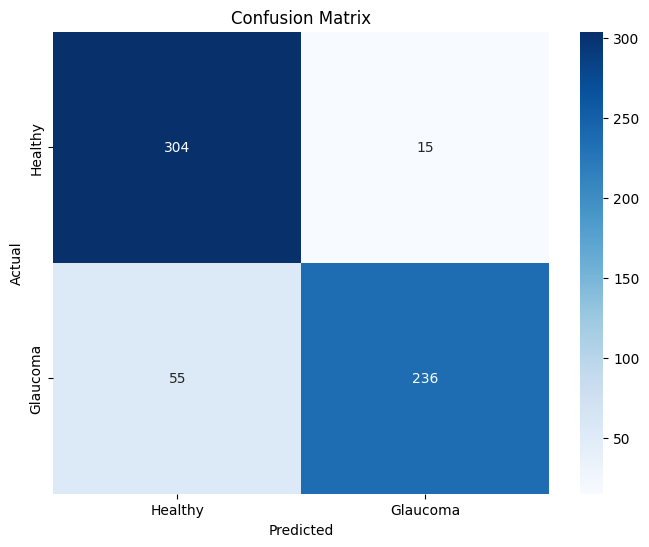

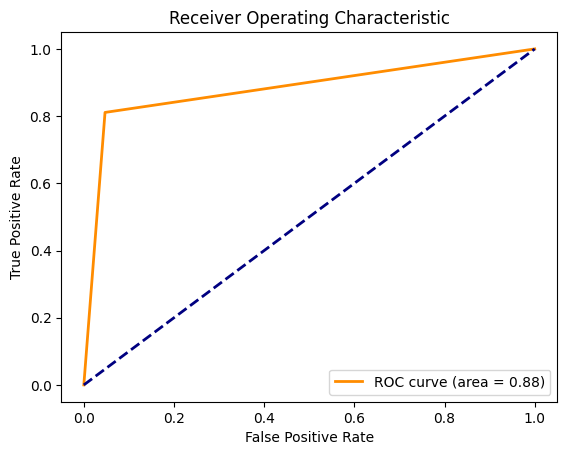

In [13]:
# Confusion Matrix Visualization
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Healthy', 'Glaucoma'], yticklabels=['Healthy', 'Glaucoma'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve Visualization
from sklearn.metrics import roc_curve, auc

fpr, tpr, _ = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

## Load and predict using 3D DenseNet-121

In [15]:
import torch
import numpy as np

import torch
import numpy as np

def predict_from_npy(model, npy_path, device):
    """
    Load a .npy file, preprocess it, and predict using a PyTorch model.

    Args:
        model (torch.nn.Module): The trained PyTorch model.
        npy_path (str): Path to the .npy file.
        device (str): Device to run inference on ('cpu' or 'cuda').

    Returns:
        torch.Tensor: Model output (logits or probabilities).
    """
    input_data = np.load(npy_path)
    if input_data.ndim == 5:  # If shape (1, 64, 64, 64, 1)
        input_data = np.squeeze(input_data, axis=-1)
    elif input_data.ndim == 4:  # If shape (64, 64, 64, 1)
        input_data = np.squeeze(input_data, axis=-1)
        input_data = np.expand_dims(input_data, axis=0)  # Add channel dimension
    elif input_data.ndim == 3:  # If shape (64, 64, 64)
        input_data = np.expand_dims(input_data, axis=0)  # Add channel dimension
    else:
        raise ValueError(f"Unexpected data shape: {input_data.shape}")

    # Convert to PyTorch tensor
    input_tensor = torch.tensor(input_data, dtype=torch.float32).unsqueeze(0)

    # Move tensor to correct device
    input_tensor = input_tensor.to(device)

    # Set model to evaluation mode
    model.to(device)
    model.eval()

    with torch.no_grad():  # Disable gradients for inference
        output = model(input_tensor)  # Forward pass

    return output  # Return model output (logits or probabilities)

# Load the trained model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = '/kaggle/input/3d_densenet_121_glaucoma/pytorch/default/1/densenet3d_glaucoma_model.pth'
# Initialize the model and load trained weights
model = DenseNet3D(num_classes=2)
model.load_state_dict(torch.load(model_path, map_location=device))

# Path to your .npy file
npy_file_path = "/kaggle/input/glaucoma-3d/normal_3d/normal_3d/n_1.npy"

# Perform prediction
output = predict_from_npy(model, npy_file_path, device)
print("Raw Output:", output)

# If it's a classification task (e.g., glaucoma vs. normal)
predicted_class = torch.argmax(output, dim=1).item()
print("Predicted Class:", predicted_class)

<ipython-input-15-e6b26cd43fc2>:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


Raw Output: tensor([[ 1.9845, -1.9913]], device='cuda:0')
Predicted Class: 0


# XGBoost model

In [20]:
import tensorflow as tf
from tensorflow import keras
import torch

### Load all the models

In [6]:
device = torch.device('cpu')

# Instantiate the models
resnet18_3d_model = ResNet3D(num_classes=2)
densenet121_3d_model = DenseNet3D(num_classes=2)
cnn_encoder_3d_model = CNNEncoder3D()

resnet18_2d_model_path = '/kaggle/input/2d-resnet-18-glaucoma-model/keras/default/1/resnet18_2d_glaucoma_model.keras'
resnet18_3d_model_path = '/kaggle/input/3d-resnet-18-glaucoma/tensorflow2/default/3/glaucoma_model.pth'
cnn_encoder_3d_model_path = '/kaggle/input/3d_cnn_encoder_glaucoma/pytorch/default/1/3d_cnn_encoder_glaucoma_model.pth'
densenet121_3d_model_path = '/kaggle/input/3d_densenet_121_glaucoma/pytorch/default/1/densenet3d_glaucoma_model.pth'

# Load the Keras model as usual
resnet18_2d_model = keras.models.load_model(resnet18_2d_model_path)

# Load PyTorch model weights correctly without reassigning
resnet18_3d_model.load_state_dict(torch.load(resnet18_3d_model_path, map_location=device))
densenet121_3d_model.load_state_dict(torch.load(densenet121_3d_model_path, map_location=device))
cnn_encoder_3d_model.load_state_dict(torch.load(cnn_encoder_3d_model_path, map_location=device))

# Set all models to evaluation mode
resnet18_3d_model.eval()
densenet121_3d_model.eval()
cnn_encoder_3d_model.eval()

<ipython-input-6-4d6d7b0533a9>:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  resnet18_3d_model.load_state_dict(torch.load(resnet18_3d_model_path, map_location=device))
<

CNNEncoder3D(
  (conv1): Conv3d(1, 32, kernel_size=(7, 7, 7), stride=(2, 2, 2), padding=(3, 3, 3))
  (bn1): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu1): ReLU(inplace=True)
  (pool1): MaxPool3d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (conv2): Conv3d(32, 64, kernel_size=(5, 5, 5), stride=(1, 1, 1), padding=(2, 2, 2))
  (bn2): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu2): ReLU(inplace=True)
  (conv3): Conv3d(64, 128, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (bn3): BatchNorm3d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu3): ReLU(inplace=True)
  (conv4): Conv3d(128, 256, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (bn4): BatchNorm3d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu4): ReLU(inplace=True)
  (conv5): Conv3d(256, 512, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding

In [10]:
import os
import numpy as np
import torch
from tensorflow import keras
import matplotlib.pyplot as plt

# -----------------------------
# 1. Define wrapper prediction functions
# -----------------------------

# 2D ResNet-18 Prediction Wrapper (Keras)
def predict_resnet18_2d(npy_path):
    """
    Loads a 2D image from a .npy file, reshapes it to (64,64,1) if needed,
    and returns the prediction score from the Keras ResNet-18 model.
    """
    image = np.load(npy_path)
    if image.shape != (64, 64, 1):
        try:
            image = np.reshape(image, (64, 64, 1))
        except ValueError:
            print("Cannot be reshaped!")
            return
    # plt.imshow(image)
    image = np.expand_dims(image, axis=0)
    prediction = resnet18_2d_model.predict(image)
    return torch.tensor(prediction)

def predict_resnet18_3d(image_path):
    """
    Loads a 3D volume from a .npy file, preprocesses it, and returns the probability
    from the 3D ResNet-18 PyTorch model (probability for class 1).
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    resnet18_3d_model.to(device)
    resnet18_3d_model.eval() 
    image = np.load(image_path)
    if image.shape[-1] == 1:
        image = image.squeeze(-1)
    
    image_tensor = torch.tensor(image, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)
    with torch.no_grad():
        output = resnet18_3d_model(image_tensor)
    return output


def predict_cnn_encoder_3d(npy_path):
    """
    Loads a 3D volume from a .npy file and returns the probability
    from the 3D CNN Encoder PyTorch model.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    input_data = np.load(npy_path)
    if input_data.ndim == 5:  # e.g., (1,64,64,64,1)
        input_data = np.squeeze(input_data, axis=-1)
    elif input_data.ndim == 4:  # e.g., (64,64,64,1)
        input_data = np.squeeze(input_data, axis=-1)
        input_data = np.expand_dims(input_data, axis=0)
    elif input_data.ndim == 3:  # e.g., (64,64,64)
        input_data = np.expand_dims(input_data, axis=0)
    else:
        raise ValueError(f"Unexpected data shape: {input_data.shape}")
    
    # Convert to tensor and add batch dimension: (1, 1, D, H, W)
    input_tensor = torch.tensor(input_data, dtype=torch.float32).unsqueeze(0).to(device)
    cnn_encoder_3d_model.to(device)
    cnn_encoder_3d_model.eval()
    with torch.no_grad():
        output = cnn_encoder_3d_model(input_tensor)
    return output


def predict_densenet121_3d(npy_path):
    """
    Loads a 3D volume from a .npy file and returns the probability
    from the 3D DenseNet121 PyTorch model.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    input_data = np.load(npy_path)
    if input_data.ndim == 5:
        input_data = np.squeeze(input_data, axis=-1)
    elif input_data.ndim == 4:
        input_data = np.squeeze(input_data, axis=-1)
        input_data = np.expand_dims(input_data, axis=0)
    elif input_data.ndim == 3:
        input_data = np.expand_dims(input_data, axis=0)
    else:
        raise ValueError(f"Unexpected data shape: {input_data.shape}")
    
    input_tensor = torch.tensor(input_data, dtype=torch.float32).unsqueeze(0).to(device)
    densenet121_3d_model.to(device)
    densenet121_3d_model.eval()
    with torch.no_grad():
        output = densenet121_3d_model(input_tensor)
    return output

def get_feature_tensor(image_index, category='normal'):
    """
    Extracts features from 2D and 3D models for the given image index and category.
    For 2D, the corresponding .npy file from the 2D dataset is used.
    For 3D, the corresponding .npy file from the 3D dataset is used.
    
    The function expects each model's prediction to be either:
      - A 2D tensor of shape (1,1), or
      - A 2D tensor of shape (1,2) from which the glaucoma probability (second column) is selected.
      
    All features are then concatenated into a final tensor of shape (4,1).
    
    Args:
        image_index (int): The index used to construct the file name.
        category (str): Either 'normal' or 'glaucoma'.
        
    Returns:
        torch.Tensor: A tensor of shape (4,1) containing the features.
    """
    import torch
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Define file paths based on category
    if category == 'normal':
        image_2d = f'/kaggle/input/glaucoma-2d/normal_2d/n_{image_index}.npy'
        image_3d = f'/kaggle/input/glaucoma-3d/normal_3d/normal_3d/n_{image_index}.npy'
    elif category == 'glaucoma':
        image_2d = f'/kaggle/input/glaucoma-2d/poag_2d/g_{image_index}.npy'
        image_3d = f'/kaggle/input/glaucoma-3d/poag_3d/poag_3d/g_{image_index}.npy'
    else:
        raise ValueError('Category undefined')
    
    # Get features from each model using your prediction functions
    # These functions are assumed to return either a (1,1) or (1,2) output.
    feature_2d = predict_resnet18_2d(image_2d)
    feature_resnet3d = predict_resnet18_3d(image_3d)
    feature_densenet3d = predict_densenet121_3d(image_3d)
    feature_cnn_encoder3d = predict_cnn_encoder_3d(image_3d)
    
    # Ensure each feature is a tensor
    if not torch.is_tensor(feature_2d):
        feature_2d = torch.tensor(feature_2d)
    if not torch.is_tensor(feature_resnet3d):
        feature_resnet3d = torch.tensor(feature_resnet3d)
    if not torch.is_tensor(feature_densenet3d):
        feature_densenet3d = torch.tensor(feature_densenet3d)
    if not torch.is_tensor(feature_cnn_encoder3d):
        feature_cnn_encoder3d = torch.tensor(feature_cnn_encoder3d)
    
    # Helper function: Adjust a feature tensor to shape (1,1)
    def adjust_feature(feature):
        # If the feature has shape (1,2), select column 1 (index 1, i.e. glaucoma probability)
        if feature.ndim == 2:
            if feature.shape[1] == 2:
                return feature[:, 1:2]  # Extract second column, shape becomes (1,1)
            elif feature.shape[1] == 1:
                return feature
            else:
                raise ValueError(f"Unexpected feature shape: {feature.shape}")
        else:
            # If not 2D, try to reshape to (1,1)
            return feature.view(1,1)
    
    feature_2d = adjust_feature(feature_2d).to(device)
    feature_resnet3d = adjust_feature(feature_resnet3d).to(device)
    feature_densenet3d = adjust_feature(feature_densenet3d).to(device)
    feature_cnn_encoder3d = adjust_feature(feature_cnn_encoder3d).to(device)
    
    # Now concatenate along dimension 0. All tensors should now be (1,1)
    feature_tensor = torch.cat([feature_2d, feature_resnet3d, feature_densenet3d, feature_cnn_encoder3d], dim=0)
    return feature_tensor

def save_features_dataset(category='normal'):
    features_dir = f'/kaggle/working/{category}_stacked_features'
    os.makedirs(features_dir, exist_ok=True)
    for image_index in range(1, 1525):
        print(f'processing image_index: {image_index}')
        feature_tensor = get_feature_tensor(image_index, category=category)
        torch.save(feature_tensor, os.path.join(features_dir, f'{category[0]}_{image_index}.pt'))

save_features_dataset(category='normal')
save_features_dataset(category='glaucoma')

processing image_index: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
processing image_index: 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
processing image_index: 3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
processing image_index: 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
processing image_index: 5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
processing image_index: 6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
processing image_index: 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
processing image_index: 8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
processing image_index: 9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
processing image_index: 10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
processing image_index: 11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
processing image_index: 12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
processing image_index: 13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
processing image_index: 14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
processing image_index: 15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
processing image_index: 16
1/1 ━━━

In [6]:
import os
import torch
import numpy as np
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (accuracy_score, roc_auc_score, precision_score, 
                             recall_score, f1_score, log_loss, confusion_matrix, roc_curve, auc, precision_recall_curve)

In [3]:

# -----------------------------
# 1. Load the saved feature files and build the dataset
# -----------------------------

def load_feature_files(features_dir):
    """
    Loads features saved as .pt files from a directory.
    Infers the label from the file name:
      - Files starting with 'n_' are labeled 0 (normal).
      - Files starting with 'g_' are labeled 1 (glaucoma).
      
    Returns:
        X: numpy array of feature vectors.
        y: numpy array of labels.
    """
    features = []
    labels = []
    for filename in os.listdir(features_dir):
        if filename.endswith('.pt'):
            file_path = os.path.join(features_dir, filename)
            # Load the tensor (assumed shape like (4,1)) and flatten to (4,)
            feature_tensor = torch.load(file_path)
            feature_array = feature_tensor.cpu().numpy().flatten()
            # Infer label from filename
            if filename.startswith('n_'):
                label = 0
            elif filename.startswith('g_'):
                label = 1
            else:
                raise ValueError(f"Filename {filename} does not follow naming convention!")
            features.append(feature_array)
            labels.append(label)
    return np.array(features), np.array(labels)

# Directories where your features are saved
normal_features_dir = '/kaggle/input/normal-stacked-features-glaucoma/kaggle/working/normal_stacked_features'
glaucoma_features_dir = '/kaggle/input/glaucoma-stacked-features/kaggle/working/glaucoma_stacked_features'

# Load features from both directories
X_normal, y_normal = load_feature_files(normal_features_dir)
X_glaucoma, y_glaucoma = load_feature_files(glaucoma_features_dir)

# Combine datasets
X = np.concatenate((X_normal, X_glaucoma), axis=0)
y = np.concatenate((y_normal, y_glaucoma), axis=0)

# -----------------------------
# 2. Split the dataset and train an XGBoost meta-model
# -----------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y)

# Create XGBoost DMatrix objects
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# Set parameters for binary classification
params = {
    'objective': 'binary:logistic',
    'eval_metric': 'auc',
    'max_depth': 3,
    'eta': 0.1,
    'seed': 42
}
num_rounds = 100

# Train the meta-model
bst = xgb.train(params, dtrain, num_rounds)

#Save the model
bst.save_model('XGBoost_model.json')

# Evaluate performance on the test set
y_pred_prob = bst.predict(dtest)
y_pred = (y_pred_prob > 0.5).astype(int)

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_prob)

print("Meta-model Accuracy:", accuracy)
print("Meta-model ROC AUC:", roc_auc)

<ipython-input-3-4ccad30acdb5>:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  feature_tensor = torch.load(file_path)


Meta-model Accuracy: 0.9180327868852459
Meta-model ROC AUC: 0.9781241601719968


Accuracy: 0.9180
ROC AUC: 0.9781
Precision: 0.8923
Recall: 0.9508
F1 Score: 0.9206
Log Loss: 0.1890


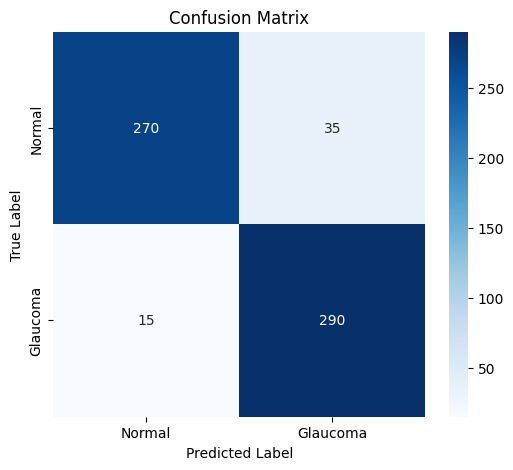

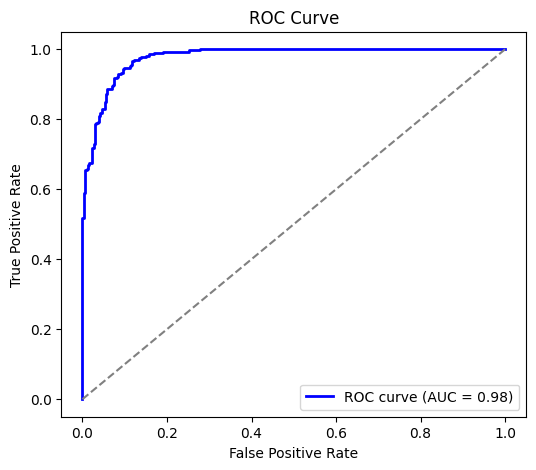

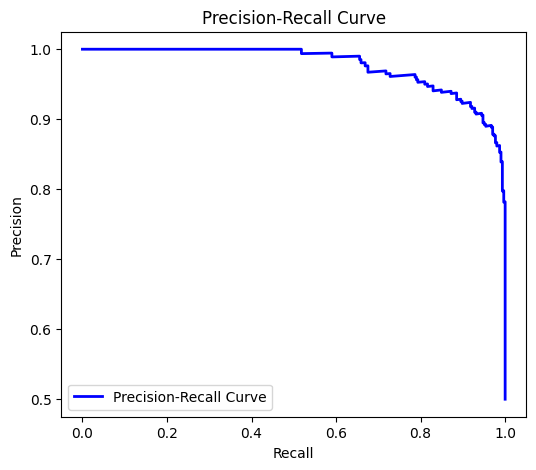

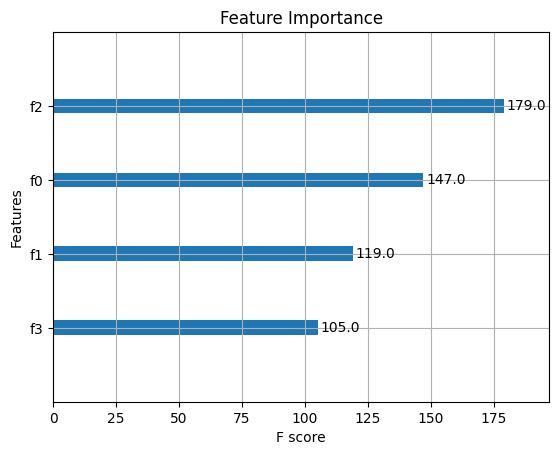

In [7]:
# Predictions
y_pred_prob = bst.predict(dtest)
y_pred = (y_pred_prob > 0.5).astype(int)

# -----------------------------
# Additional Metrics
# -----------------------------
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_prob)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
logloss = log_loss(y_test, y_pred_prob)

print(f"Accuracy: {accuracy:.4f}")
print(f"ROC AUC: {roc_auc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Log Loss: {logloss:.4f}")

# -----------------------------
# Confusion Matrix
# -----------------------------
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Normal", "Glaucoma"], yticklabels=["Normal", "Glaucoma"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# -----------------------------
# ROC Curve
# -----------------------------
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

# -----------------------------
# Precision-Recall Curve
# -----------------------------
precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_prob)
plt.figure(figsize=(6,5))
plt.plot(recall_vals, precision_vals, color='blue', lw=2, label='Precision-Recall Curve')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend()
plt.show()

# -----------------------------
# Feature Importance
# -----------------------------
xgb.plot_importance(bst, max_num_features=10)
plt.title("Feature Importance")
plt.show()

In [13]:
# -----------------------------
# 3. Define a helper function for final prediction on a new feature tensor
# -----------------------------
def meta_predict(feature_tensor):
    """
    Given a feature tensor (e.g. extracted using your models), convert it to a
    numpy array and use the trained XGBoost meta-model to perform final prediction.
    
    Args:
        feature_tensor (torch.Tensor): A tensor (e.g. shape (4,1)) containing the features.
        
    Returns:
        tuple: (predicted_class, predicted_probability)
    """
    # Flatten the tensor to shape (n_features,)
    feature_array = feature_tensor.cpu().numpy().flatten()
    dmatrix = xgb.DMatrix(feature_array.reshape(1, -1))
    prob = bst.predict(dmatrix)[0]
    pred_class = 1 if prob > 0.5 else 0
    return pred_class, prob

# -----------------------------
# 4. Example usage of final meta-model prediction
# -----------------------------

sample_feature_path = os.path.join(normal_features_dir, "n_134.pt")
sample_feature = torch.load(sample_feature_path)
pred_class, prob = meta_predict(sample_feature)
print("Final Prediction:", pred_class, "with probability:", prob)

Final Prediction: 0 with probability: 0.48354432


<ipython-input-13-4edacfc766dd>:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  sample_feature = torch.load(sample_feature_path)
